In [1]:
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp
import matplotlib

In [36]:
file_location = "../data/GALEX/galex.txt"


data = []
longitudes = []
latitudes = []
signals = []

# Open the file for reading
with open(file_location, 'r') as file:
    # Skip the first 17 lines
    for _ in range(17):
        next(file)
    
    # Process the remaining lines
    for line in file:
        # Split the line into columns
        columns = line.split()
        
        # Extract the first three columns (longitude, latitude, and signal)
        longitude = float(columns[0])
        latitude = float(columns[1])
        signal = float(columns[2])
        
        # Append the extracted data to the respective lists
        longitudes.append(longitude)
        latitudes.append(latitude)
        signals.append(signal)


# Convert the lists to numpy arrays
longitudes = np.array(longitudes)
latitudes = np.array(latitudes)
signals = np.array(signals)



In [17]:
2**7

128

/tmp/ipykernel_33680/2456864883.py:18: RuntimeWarning: divide by zero encountered in log10
  skymap = np.log10(skymap)  # Adding 1 to avoid log(0)
/tmp/ipykernel_33680/2456864883.py:18: RuntimeWarning: invalid value encountered in log10
  skymap = np.log10(skymap)  # Adding 1 to avoid log(0)


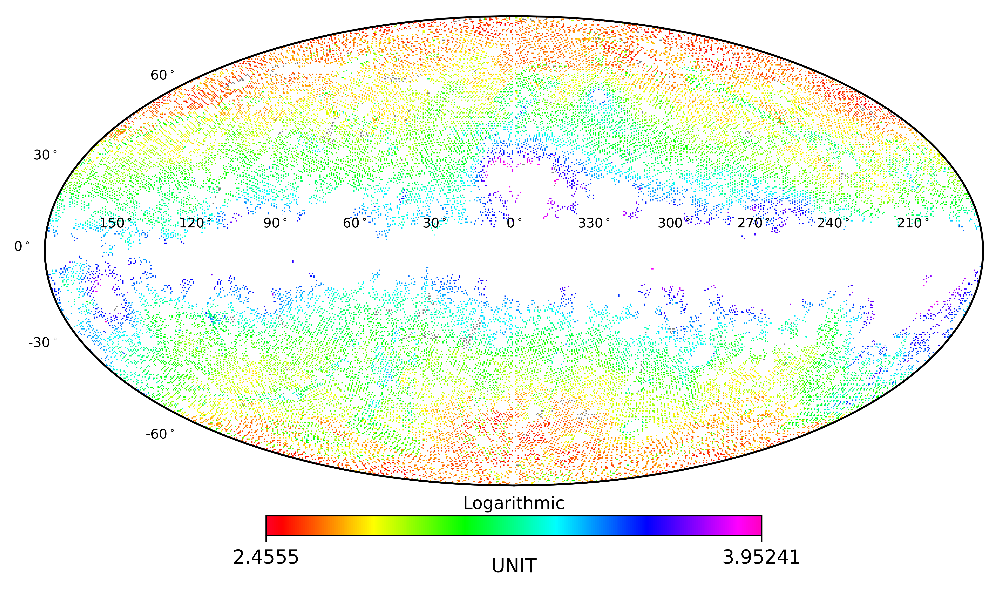

In [18]:
# Convert the longitude and latitude to theta and phi for Healpy
theta = np.radians(90.0 - latitudes)  # Convert latitude to colatitude (theta)
phi = np.radians(longitudes)          # Convert longitude to longitude in radians (phi)

# Create a Healpy map
nside = 2**7  # You can adjust this parameter
npix = hp.nside2npix(nside)
skymap = np.zeros(npix)

# Convert theta and phi to pixel indices
pixels = hp.ang2pix(nside, theta, phi)

# Accumulate the signal values in the map
for pixel, signal in zip(pixels, signals):
    skymap[pixel] += signal

# Apply a logarithmic scale to the skymap
skymap = np.log10(skymap)  # Adding 1 to avoid log(0)

# Plot the skymap using mollview
# hp.mollview(skymap, coord=['C'], title='GALEX Skymap', unit='log(Signal)',
#             cmap='gist_rainbow', norm='hist')
f1 = plt.figure(figsize=(7.5,4.5), dpi=700)
hp.mollview(skymap, 
            title="", 
            rot=(0,0,0),
            cmap='gist_rainbow', 
            fig=f1, 
            unit="")

hp.graticule(dmer=30,dpar=30, alpha=1, color="white", linewidth=10)
longitude_labels = [150,120,90,60,30,0,330,300,270,240,210]
for i in range(len(longitude_labels)):
    plt.text((-5+i)*0.34,0.1,str(longitude_labels[i])+"$^\circ$",size=7,horizontalalignment="center")

latitude_labels = [-60,-30,0,30,60]
plt.text(-2.01,-0.41,"-30$^\circ$",size=7,horizontalalignment="center") 
plt.text(-2.1,0,"0$^\circ$",size=7,horizontalalignment="center")
plt.text(-2,0.39,"30$^\circ$",size=7,horizontalalignment="center") 
plt.text(-1.5,0.73,"60$^\circ$",size=7,horizontalalignment="center") 
plt.text(-1.51,-0.8,"-60$^\circ$",size=7,horizontalalignment="center") 
plt.text(0,-1.10,"Logarithmic",size=9,horizontalalignment="center")
#plt.text(0,-1.37,"photons$\,\cdot\,$cm$^{-2}\cdot$A$^{-1}\cdot$s$^{-1}\cdot$sr$^{-1}$",size=10,horizontalalignment="center")
plt.text(0,-1.37,"UNIT",size=10,horizontalalignment="center")
# plt.savefig("simulated_signal_sky_map.png")
plt.show()


In [33]:
len(signals[signals!=-1])

31383

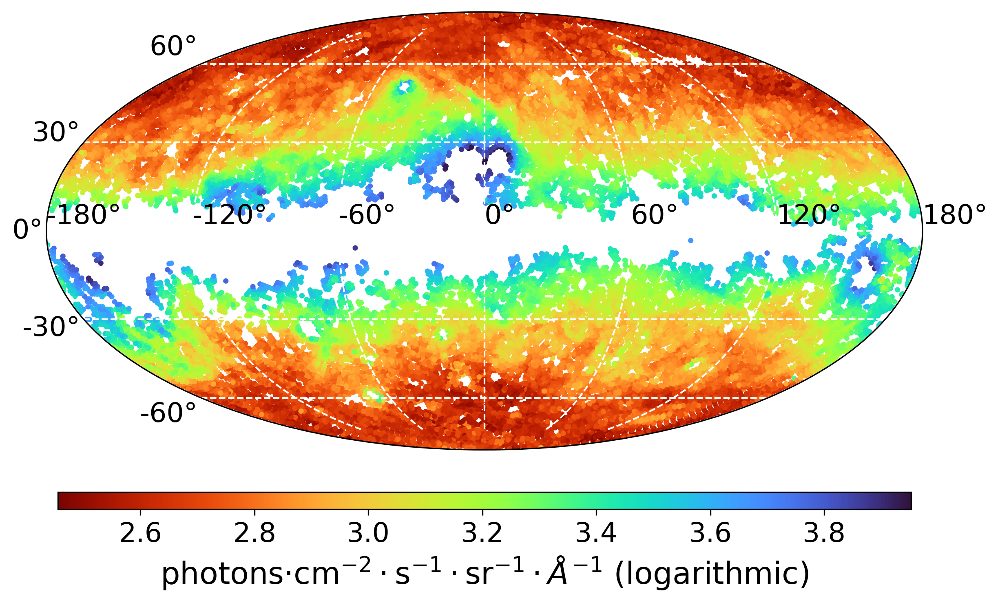

In [110]:
signals_filter = signals!=-1
signals    =    signals[signals_filter]
longitudes = longitudes[signals_filter]
latitudes  =  latitudes[signals_filter]

signals = signals[signals!=-1]
log_signals = np.log10(signals)  # Adding 1 to avoid log(0)

# Create a mollview plot
fig = plt.figure(figsize=(12,6), dpi=300)
ax = fig.add_subplot(111, projection='mollweide')

# Convert degrees to radians for plotting
longitudes_rad = np.radians(longitudes)
latitudes_rad = np.radians(latitudes)

# Adjust longitudes to be in the range [-pi, pi]
longitudes_rad = (longitudes_rad + np.pi) % (2 * np.pi) - np.pi

# Normalize the log signals to the range [0, 1] for color mapping
norm = plt.Normalize(vmin=2.455, vmax=log_signals.max())
cmap = plt.get_cmap('turbo_r')

# Scatter plot of the points
sc = ax.scatter(longitudes_rad, latitudes_rad, c=log_signals, cmap=cmap, norm=norm, s=10, edgecolor='none')

ax.grid(True, color='white', linestyle='--', linewidth=1)

# Add a colorbar
cbar = plt.colorbar(sc, orientation='horizontal', pad=0.075, aspect=50, shrink=0.75)
cbar.set_label(r'photons$\cdot$cm$^{-2}\cdot$s$^{-1}\cdot$sr$^{-1}\cdot\AA^{-1}$ (logarithmic)', size=18)
cbar.ax.tick_params(labelsize=16)

# Customize tick marks for longitude and latitude
longitude_ticks = np.arange(-180, 181, 60)
ax.set_xticks(np.radians(longitude_ticks))
ax.set_xticklabels([f'{int(tick)}°' for tick in longitude_ticks], size=16)

latitude_ticks = [-60, -30, 0, 30, 60]
ax.set_yticks(np.radians(latitude_ticks))
ax.set_yticklabels([f'{int(tick)}°' for tick in latitude_ticks], size=16)
# Move longitude tick labels down

for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("left")
# Set plot title
# plt.title('GALEX Skymap')

# Show the plot
plt.savefig("GALEX-UV.pdf", bbox_inches="tight")
plt.show()

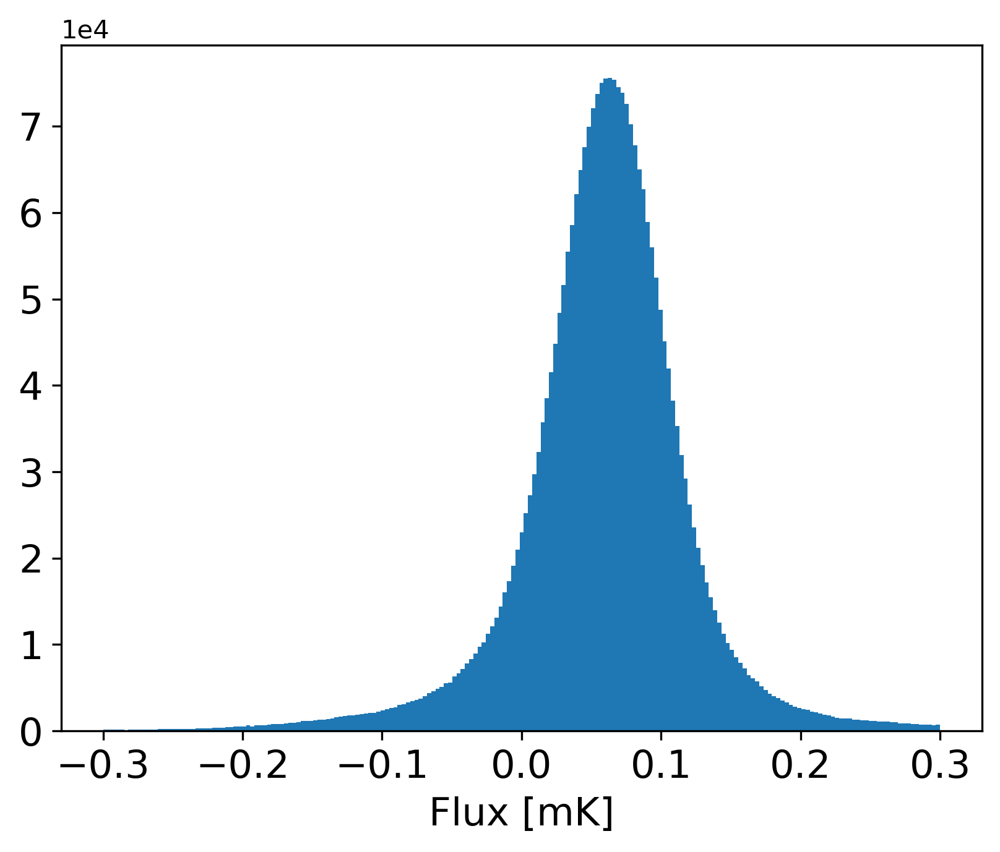

In [3]:
# Importing WMAP Haze data
# .fits file taken from https://faun.rc.fas.harvard.edu/dfink/skymaps/haze/table/
location = "/data4/msekatchev/wmaphaze/"
location = "../data/WMAP/"
filename = "wmap_k_ffhaze_yr1.fits"
wmaphaze = hp.read_map(location + filename)

save_name = "../visuals/wmap-histogram"
plt.figure(dpi=300)
plt.hist(wmaphaze[np.where(wmaphaze != 0)], bins = np.linspace(-0.3,0.3,200))
plt.xlabel("Flux [mK]", size=15)
plt.xticks(size=15)
plt.yticks(size=15)
plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
#plt.xlim([-0.5,0.5])
plt.savefig(save_name+".png", bbox_inches='tight')
plt.savefig(save_name+".svg", bbox_inches='tight')
plt.show()

array([0.06180905])

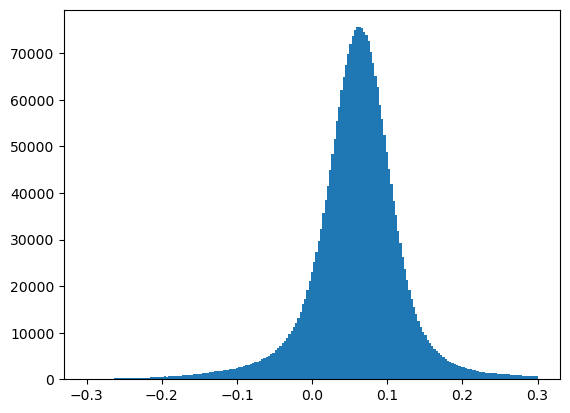

In [4]:
data = plt.hist(wmaphaze[np.where(wmaphaze != 0)], bins = np.linspace(-0.3,0.3,200))
data[1][np.where(data[0]==max(data[0]))]

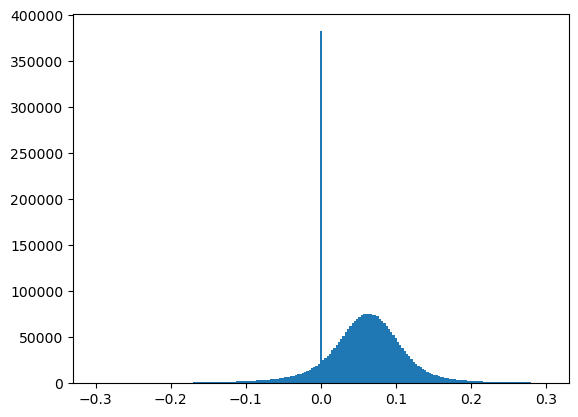

In [9]:
plt.hist(wmaphaze, bins = np.linspace(-0.3,0.3,200))
plt.show()

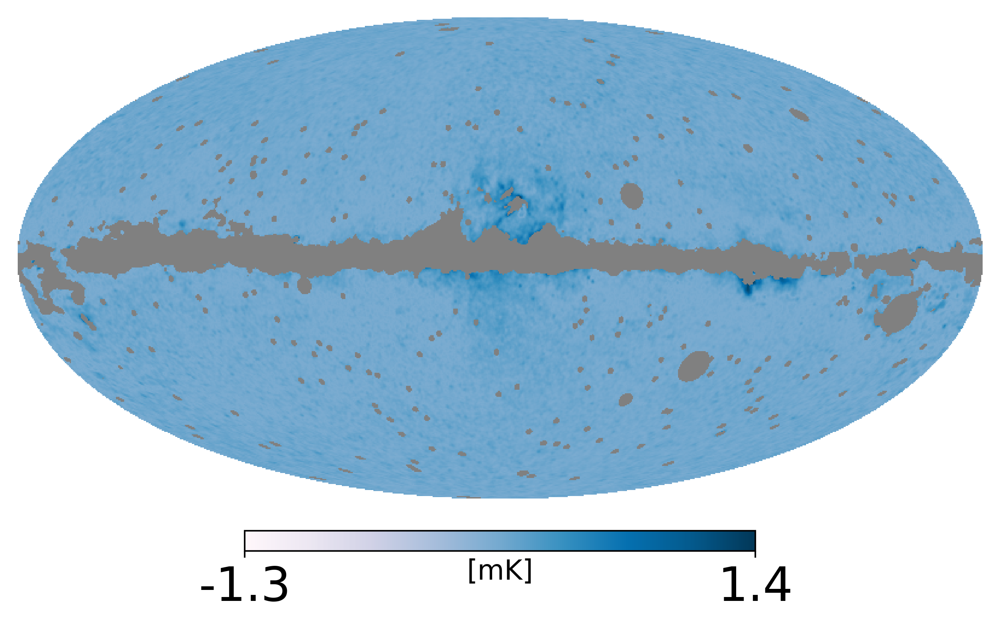

In [7]:
save_name = "../visuals/wmap-skymap"
f1 = plt.figure(figsize=(7.5,4.5), dpi=400)
#wmaphaze[np.where(wmaphaze==0)] = -1000
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(plot_wmaphaze, 
            title="", 
            rot=(0,0,0),
            cmap='PuBu', 
            fig=f1, 
            unit="[mK]",
            min=-1.3,
            max=1.4)

fontsize = 24
matplotlib.rcParams.update({'font.size':fontsize})

plt.savefig(save_name+".png", bbox_inches='tight')
plt.savefig(save_name+".svg", bbox_inches='tight')
plt.show()

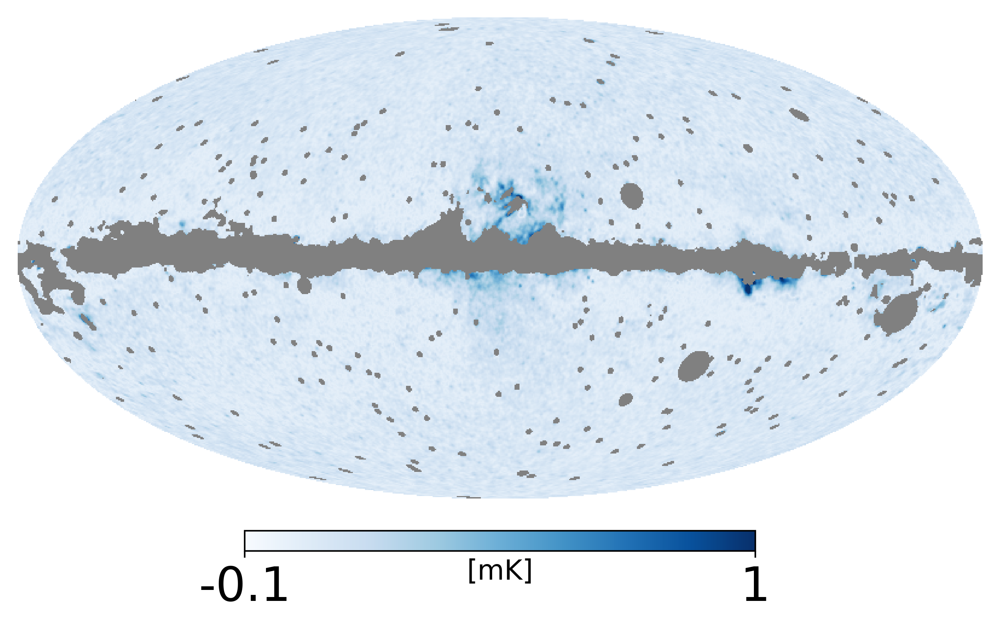

In [27]:
save_name = "../visuals/wmap-skymap"
f1 = plt.figure(figsize=(7.5,4.5), dpi=400)
#wmaphaze[np.where(wmaphaze==0)] = -1000
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(np.abs(plot_wmaphaze), 
            title="", 
            rot=(0,0,0),
            cmap='Blues', 
            fig=f1, 
            unit="[mK]",
            min=-0.1,
            max=1)

fontsize = 24
matplotlib.rcParams.update({'font.size':fontsize})

plt.savefig(save_name+".png", bbox_inches='tight')
plt.savefig(save_name+".svg", bbox_inches='tight')
plt.show()

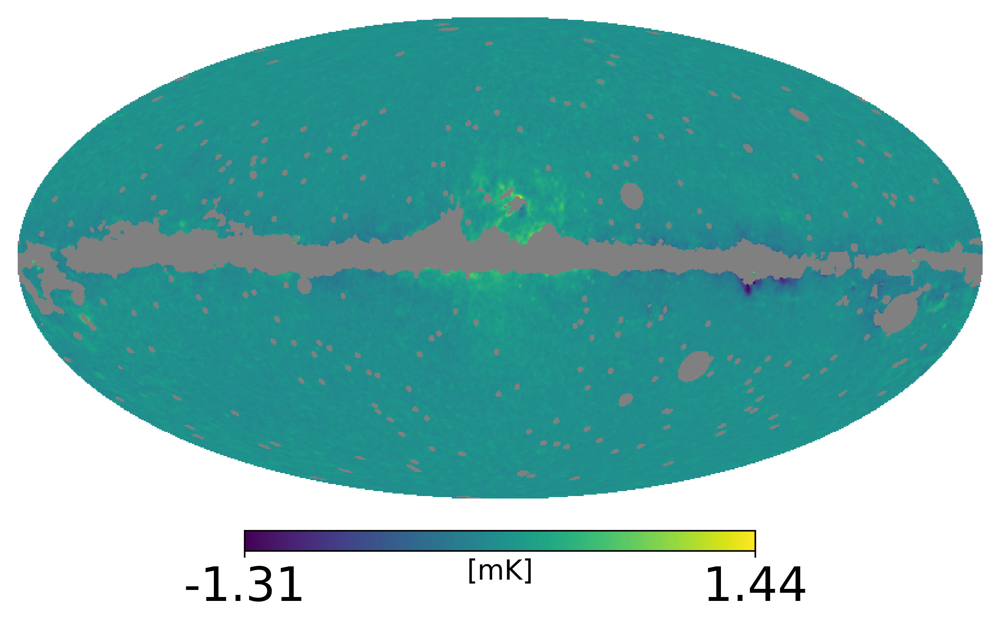

In [6]:
f1 = plt.figure(figsize=(7.5,4.5), dpi=400)
#wmaphaze[np.where(wmaphaze==0)] = -1000
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(plot_wmaphaze, 
            title="", 
            rot=(0,0,0),
            # cmap='PuBu', 
            fig=f1, 
            unit="[mK]",
            min=-1.31,
            max=1.44)
# plt.savefig("WMAP Haze Skymap.svg")
plt.show()

In [6]:
len(np.where(wmaphaze==0)[0])

359365

In [7]:
len(np.where(wmaphaze==0)[0]) / len(wmaphaze) * 100

11.423905690511067

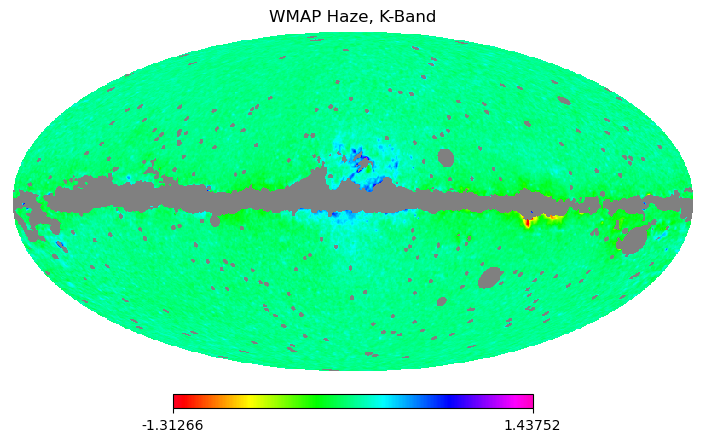

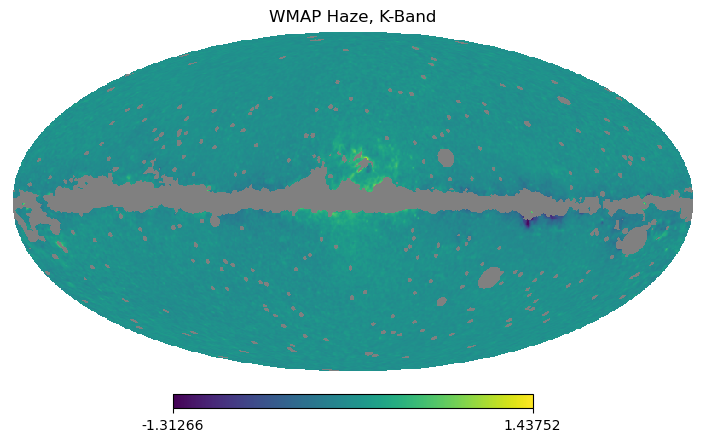

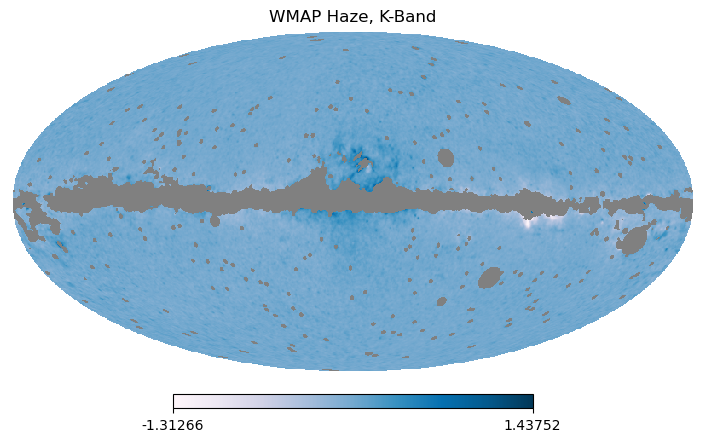

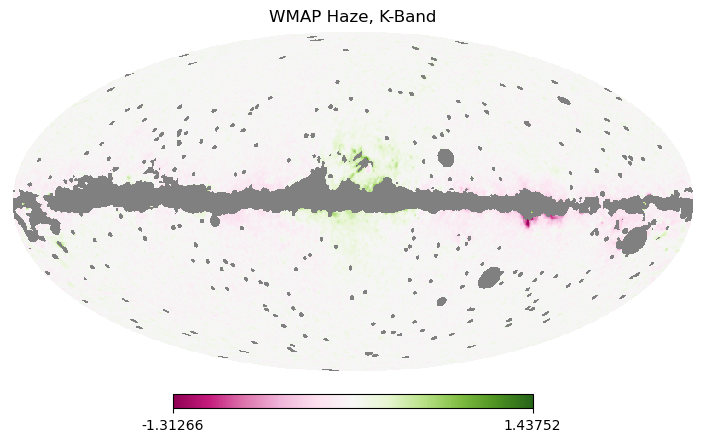

In [8]:
f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
#wmaphaze[np.where(wmaphaze==0)] = -1000
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(plot_wmaphaze, 
            title="WMAP Haze, K-Band", 
            rot=(0,0,0),
            cmap='gist_rainbow', 
            fig=f1, 
            unit="")

plt.show()
f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(plot_wmaphaze , 
            title="WMAP Haze, K-Band", 
            rot=(0,0,0), 
            fig=f1, 
            unit="")

#plt.savefig("WMAP_Haze.svg")
plt.show()


f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
#wmaphaze[np.where(wmaphaze==0)] = -1000
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(plot_wmaphaze, 
            title="WMAP Haze, K-Band", 
            rot=(0,0,0),
            cmap='PuBu', 
            fig=f1, 
            unit="")
plt.show()

f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
#wmaphaze[np.where(wmaphaze==0)] = -1000
plot_wmaphaze = wmaphaze.copy()
plot_wmaphaze[np.where(wmaphaze==0)] = np.nan
hp.mollview(plot_wmaphaze, 
            title="WMAP Haze, K-Band", 
            rot=(0,0,0),
            cmap='PiYG', 
            fig=f1, 
            unit="")
plt.show()

In [9]:
# N = 2**8


# radius_inner = np.radians(50)
# radius_outer = np.radians(50 + 1)

# pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
# pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

# pix_ring = np.setdiff1d(pix_outer, pix_inner)


In [10]:
# unfiltered_signal = wmaphaze[pix_ring]
# print(unfiltered_signal)
# filtered_signal = unfiltered_signal[unfiltered_signal != 0]
# print("\n",filtered_signal)
# np.average(filtered_signal)


i= 0 	angle: 3 	 0.4844752848148346
i= 1 	angle: 4 	 0.5112414956092834
i= 2 	angle: 5 	 0.4324159324169159
i= 3 	angle: 6 	 0.35517388582229614
i= 4 	angle: 7 	 0.30850428342819214
i= 5 	angle: 8 	 0.32423731684684753
i= 6 	angle: 9 	 0.32138359546661377
i= 7 	angle: 10 	 0.3128017783164978


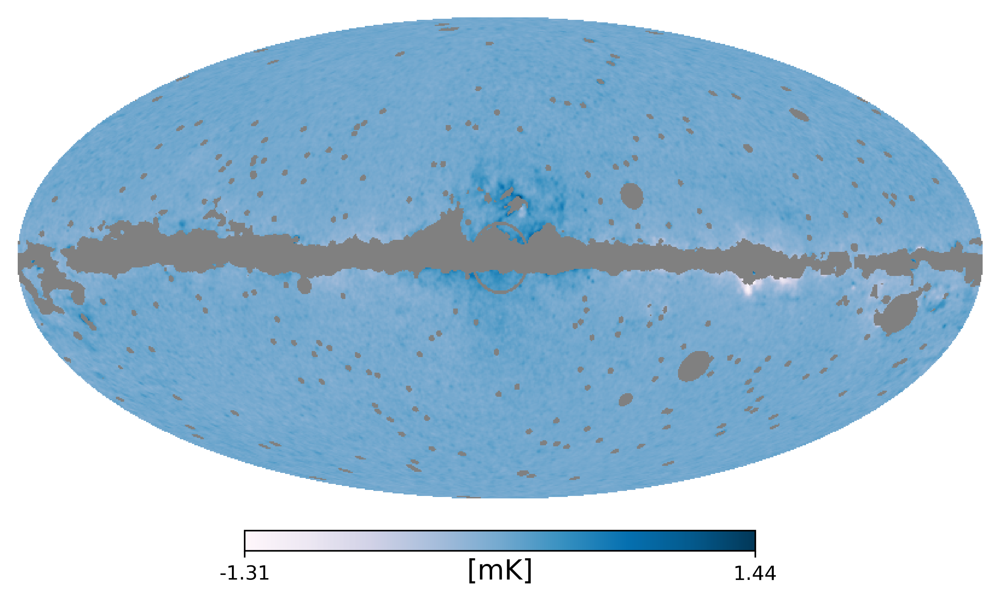

i= 8 	angle: 11 	 0.29554474353790283
i= 9 	angle: 12 	 0.24199743568897247
i= 10 	angle: 13 	 0.22024083137512207
i= 11 	angle: 14 	 0.21664690971374512
i= 12 	angle: 15 	 0.19554319977760315
i= 13 	angle: 16 	 0.1928776651620865
i= 14 	angle: 17 	 0.21501244604587555
i= 15 	angle: 18 	 0.21363355219364166
i= 16 	angle: 19 	 0.20989228785037994
i= 17 	angle: 20 	 0.21035230159759521


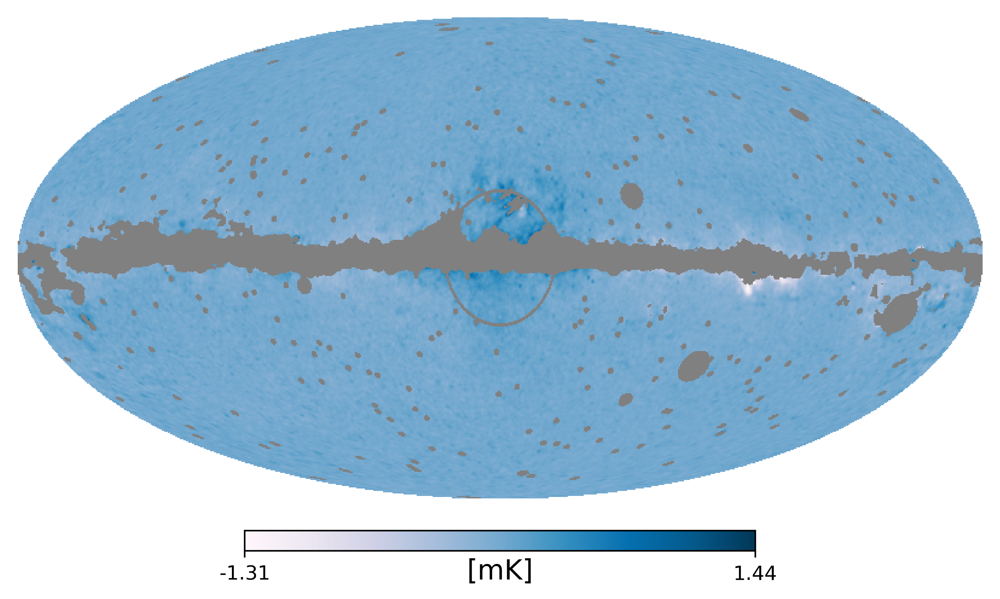

i= 18 	angle: 21 	 0.18588735163211823
i= 19 	angle: 22 	 0.17222462594509125
i= 20 	angle: 23 	 0.15702451765537262
i= 21 	angle: 24 	 0.14465117454528809
i= 22 	angle: 25 	 0.1351112276315689
i= 23 	angle: 26 	 0.1227712482213974
i= 24 	angle: 27 	 0.13269644975662231
i= 25 	angle: 28 	 0.12408792972564697
i= 26 	angle: 29 	 0.1136062815785408
i= 27 	angle: 30 	 0.1080700159072876


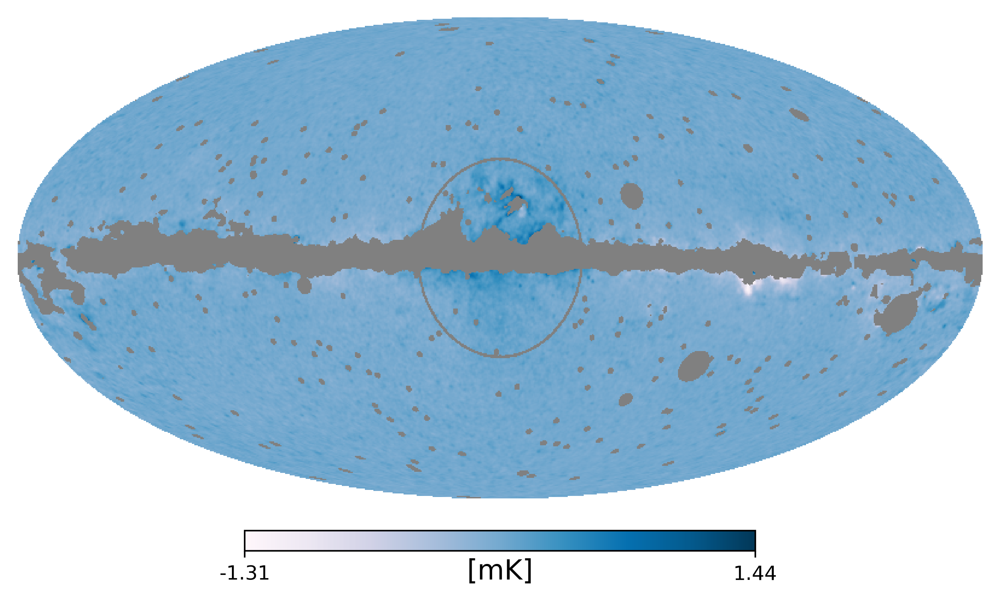

i= 28 	angle: 31 	 0.09327760338783264
i= 29 	angle: 32 	 0.08315663784742355
i= 30 	angle: 33 	 0.0848727822303772
i= 31 	angle: 34 	 0.08397961407899857
i= 32 	angle: 35 	 0.08020520955324173
i= 33 	angle: 36 	 0.06801355630159378
i= 34 	angle: 37 	 0.05820385739207268
i= 35 	angle: 38 	 0.05610891431570053
i= 36 	angle: 39 	 0.057109035551548004
i= 37 	angle: 40 	 0.058654189109802246


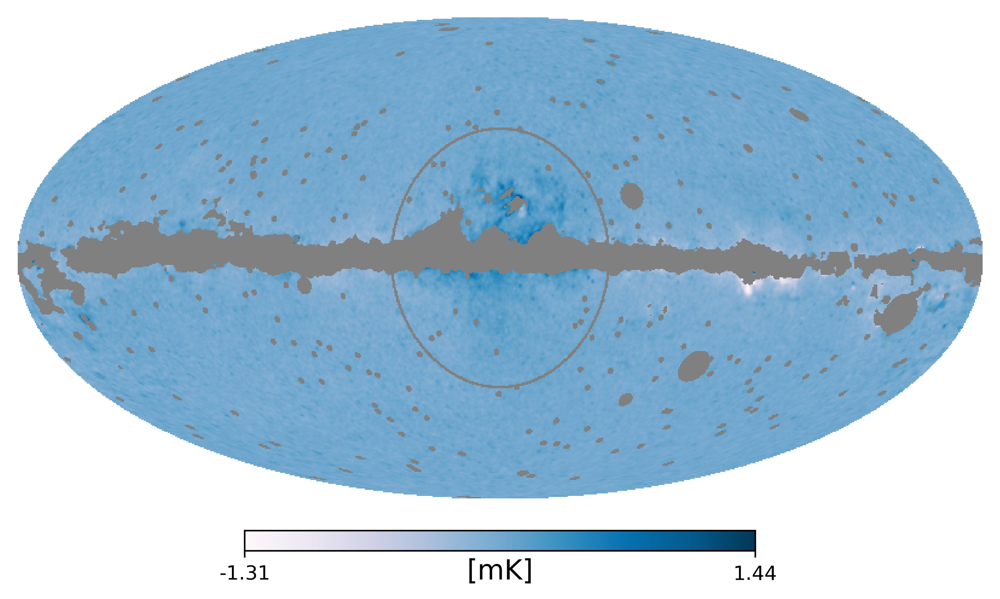

i= 38 	angle: 41 	 0.05356881394982338
i= 39 	angle: 42 	 0.051255468279123306
i= 40 	angle: 43 	 0.054095759987831116
i= 41 	angle: 44 	 0.05079369992017746
i= 42 	angle: 45 	 0.048452384769916534
i= 43 	angle: 46 	 0.05277993157505989
i= 44 	angle: 47 	 0.047381021082401276
i= 45 	angle: 48 	 0.04491453617811203
i= 46 	angle: 49 	 0.040189024060964584
i= 47 	angle: 50 	 0.04126114770770073


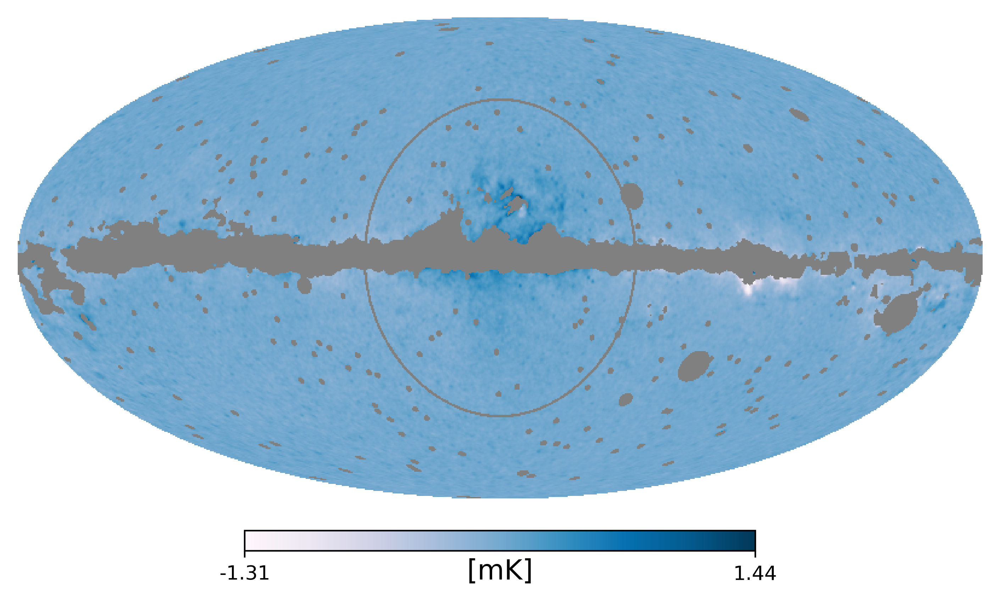

i= 48 	angle: 51 	 0.044802937656641006
i= 49 	angle: 52 	 0.052028339356184006
i= 50 	angle: 53 	 0.0474206805229187
i= 51 	angle: 54 	 0.0433119460940361
i= 52 	angle: 55 	 0.044788893312215805
i= 53 	angle: 56 	 0.04531575366854668
i= 54 	angle: 57 	 0.04512495547533035
i= 55 	angle: 58 	 0.04432163015007973
i= 56 	angle: 59 	 0.04536009579896927
i= 57 	angle: 60 	 0.04371953383088112


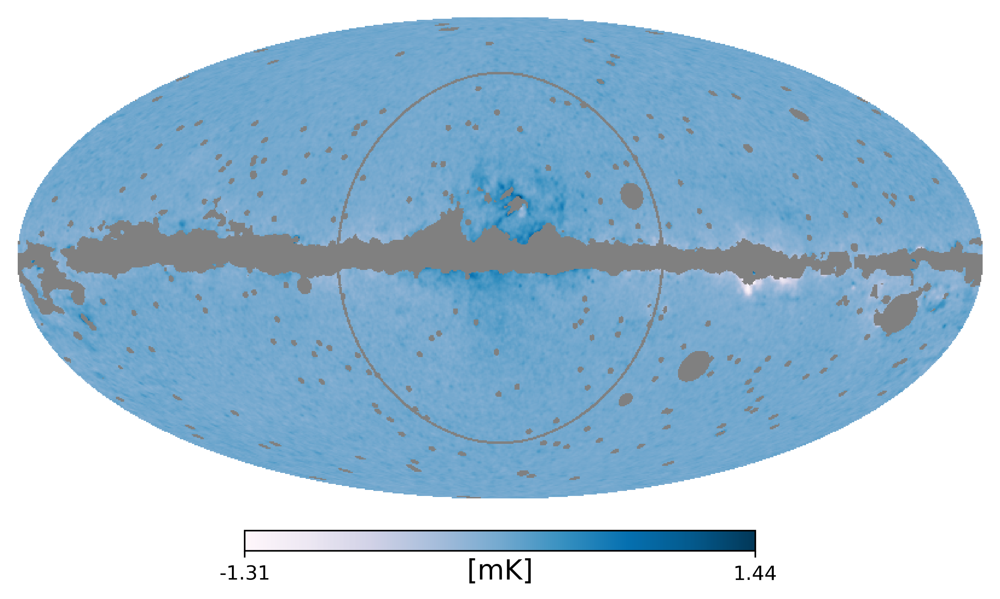

i= 58 	angle: 61 	 0.042290735989809036
i= 59 	angle: 62 	 0.045152440667152405
i= 60 	angle: 63 	 0.05096830427646637
i= 61 	angle: 64 	 0.05142463371157646
i= 62 	angle: 65 	 0.05106228590011597
i= 63 	angle: 66 	 0.051759425550699234
i= 64 	angle: 67 	 0.05643100664019585
i= 65 	angle: 68 	 0.05426818132400513
i= 66 	angle: 69 	 0.049985092133283615
i= 67 	angle: 70 	 0.05370452255010605


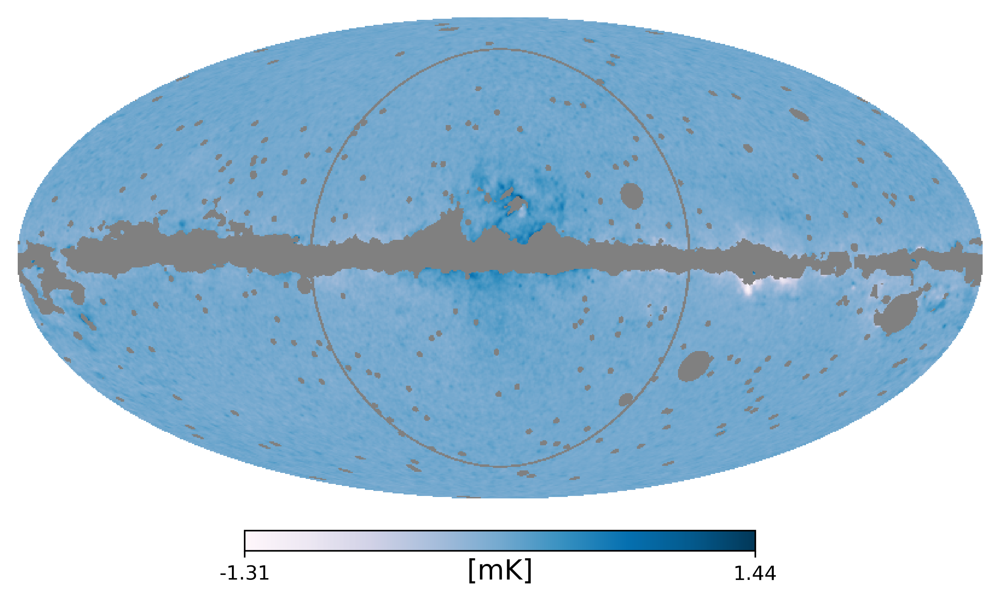

i= 68 	angle: 71 	 0.060416966676712036
i= 69 	angle: 72 	 0.057462405413389206
i= 70 	angle: 73 	 0.05745832994580269
i= 71 	angle: 74 	 0.058284591883420944
i= 72 	angle: 75 	 0.05525090917944908
i= 73 	angle: 76 	 0.0530388206243515
i= 74 	angle: 77 	 0.05354582890868187
i= 75 	angle: 78 	 0.05375371128320694
i= 76 	angle: 79 	 0.056505803018808365
i= 77 	angle: 80 	 0.05498378351330757


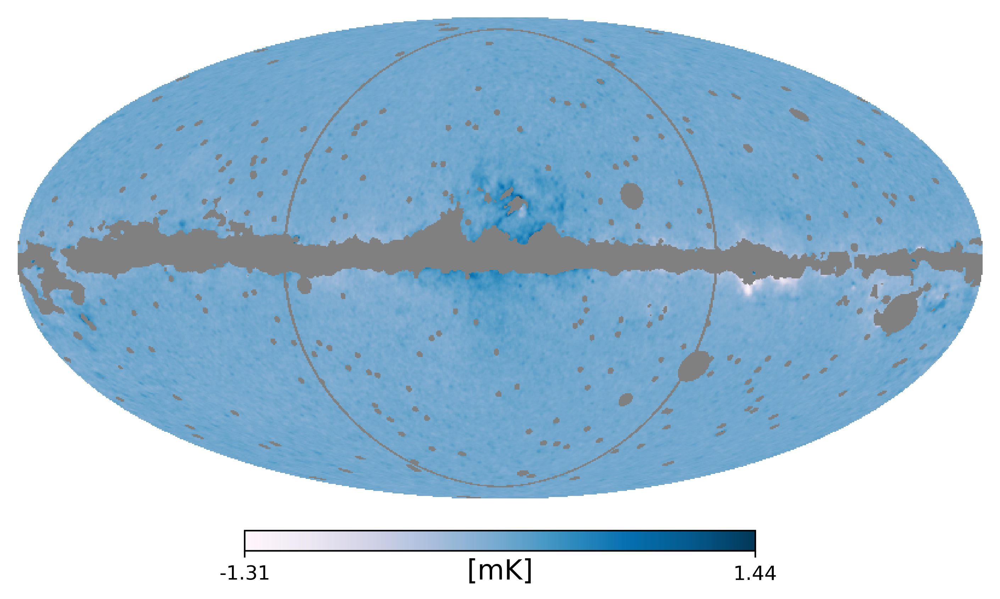

i= 78 	angle: 81 	 0.055037952959537506
i= 79 	angle: 82 	 0.05391363054513931
i= 80 	angle: 83 	 0.0544353649020195
i= 81 	angle: 84 	 0.05387331172823906
i= 82 	angle: 85 	 0.05278316140174866
i= 83 	angle: 86 	 0.0540185272693634
i= 84 	angle: 87 	 0.05386614799499512
i= 85 	angle: 88 	 0.053690019994974136
i= 86 	angle: 89 	 0.04925299063324928
i= 87 	angle: 90 	 0.049111004918813705


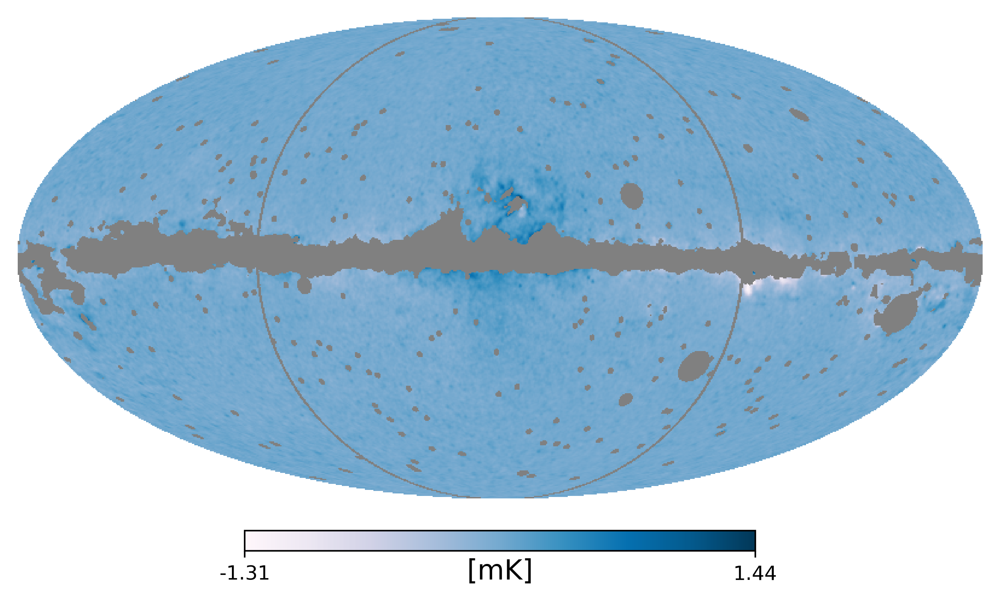

In [10]:
N = 2**9
# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)
min_angle = 3
max_angle = 91

angles = np.arange(3,91,1)
num_angles = len(angles)

angular_flux_wmap = np.zeros(num_angles)
angular_flux_wmap_error = np.zeros(num_angles)


for i in range(num_angles):
    radius_inner = np.radians(angles[i])
    radius_outer = np.radians(angles[i] + 1)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    unfiltered_signal = wmaphaze[pix_ring]
    filtered_signal = unfiltered_signal[unfiltered_signal != 0]
    
    
    angular_flux_wmap[i] = np.average(filtered_signal)
    print("i=",i,"\tangle:",angles[i],"\t",angular_flux_wmap[i])
    n_pixels = len(filtered_signal)
    angular_flux_wmap_error[i] = np.std(filtered_signal) / np.sqrt(n_pixels)
    
    if (angles[i]) % 10 == 0:
        # f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
        # plot_with_ring = wmaphaze.copy()
        # plot_with_ring[wmaphaze==0] = np.nan
        # plot_with_ring[pix_ring] = np.nan
        # hp.mollview(plot_with_ring, 
        #             title=str(angles[i]+1) + " deg", 
        #             rot=(0,0,0), 
        #             fig=f1, 
        #             unit="")
        # plt.show()
        
        f1 = plt.figure(figsize=(7.5,4.5), dpi=400)
        #wmaphaze[np.where(wmaphaze==0)] = -1000
        plot_with_ring = wmaphaze.copy()
        plot_with_ring[np.where(wmaphaze==0)] = np.nan
        plot_with_ring[pix_ring] = np.nan
        hp.mollview(plot_with_ring, 
                    title="", 
                    rot=(0,0,0),
                    cmap='PuBu', 
                    fig=f1, 
                    unit="[mK]",
                    min=-1.31,
                    max=1.44)
        plt.savefig("WMAP Haze Skymap with "+str(angles[i])+"deg Ring.svg")
        plt.savefig("WMAP Haze Skymap with "+str(angles[i])+"deg Ring.png")
        plt.show()

In [12]:
#useable_data_length = len(angular_flux_wmap[useable_data])
#useable_data = [not i for i in np.isnan(angular_flux_wmap)]
cov_matrix = np.zeros([num_angles,num_angles])

for i in range(num_angles):
    cov_matrix[i,i] = angular_flux_wmap_error[i]**2
cov_matrix

array([[4.74131441e-05, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.58884456e-05, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 8.17915951e-06, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.44339008e-07, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 1.98853581e-07, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 2.82538498e-07]])

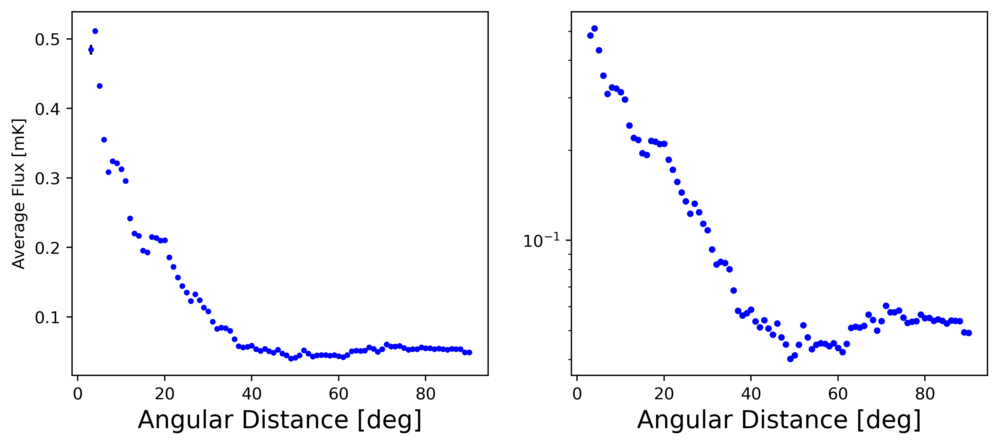

In [13]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.errorbar(angles,angular_flux_wmap, yerr=angular_flux_wmap_error, marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="black")
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_wmap, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("WMAP_flux_vs_angular_distance_180.svg", format='svg')
plt.show()

In [14]:
error_threshold_filter = 35

In [15]:
angles[error_threshold_filter]

38

In [16]:
shifted_error = np.average(angular_flux_wmap[error_threshold_filter:])
shifted_error

0.05114129403570913

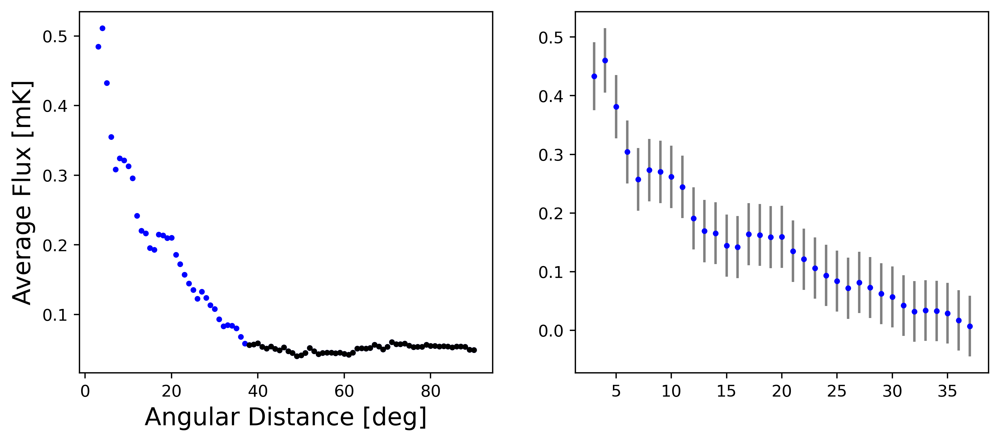

In [17]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.errorbar(angles,angular_flux_wmap, 
             #yerr=angular_flux_wmap_error, 
             marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="black")
ax1.errorbar(angles[error_threshold_filter:],
             angular_flux_wmap[error_threshold_filter:], 
             yerr=angular_flux_wmap_error[error_threshold_filter:], 
             marker=".", markersize=5, linestyle = 'none',color='black', ecolor="black")
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]', size=15)

# Plot the data on the right subplot with a log scale on the y-axis
ax2.errorbar(angles[:error_threshold_filter],
             angular_flux_wmap[:error_threshold_filter]-shifted_error, 
             yerr=angular_flux_wmap_error[:error_threshold_filter]+shifted_error, 
             marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")
# ax2.set_xlabel('Angular Distance [deg]', size=15)
# ax2.set_ylabel('Average Flux [mK]')

# Show the plot
plt.savefig("WMAP_flux_angular_unprocessed_processed.svg", format='svg')
plt.show()

In [18]:
angular_flux_wmap_error

array([0.00688572, 0.00398603, 0.00285992, 0.002376  , 0.00225832,
       0.00207525, 0.00208162, 0.00210808, 0.00209124, 0.00187128,
       0.00189155, 0.0017017 , 0.00174196, 0.00174385, 0.00183108,
       0.0017042 , 0.00183473, 0.00195917, 0.00139854, 0.00119416,
       0.00105503, 0.00101338, 0.00094846, 0.00092524, 0.00104994,
       0.00097536, 0.00079316, 0.00071886, 0.00066556, 0.00059786,
       0.00056674, 0.00050667, 0.00055677, 0.00053381, 0.00047664,
       0.00045951, 0.00044886, 0.00044172, 0.000407  , 0.00042879,
       0.0004309 , 0.00042146, 0.00042324, 0.00042509, 0.00041789,
       0.0004137 , 0.000392  , 0.00041262, 0.00041543, 0.00041093,
       0.00039811, 0.00036274, 0.00040407, 0.00042776, 0.00044334,
       0.0004486 , 0.00045249, 0.0004511 , 0.00044579, 0.00038167,
       0.0003843 , 0.00038262, 0.00035037, 0.00035844, 0.0003658 ,
       0.00033855, 0.00033679, 0.00030503, 0.00026348, 0.00026018,
       0.00025718, 0.00027679, 0.00031401, 0.00031909, 0.00033

In [19]:
angles[40:]

array([43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59,
       60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76,
       77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90])